In [35]:
#Low-pass filter
import cv2
import numpy as np
import matplotlib.pyplot as plt

def low_pass(img,i):
    f=cv2.imread(img)
    f=cv2.cvtColor(f, cv2.COLOR_BGR2GRAY)
    F = np.fft.fft2(f)
    Fshift = np.fft.fftshift(F)
    fig,ax=plt.subplots(figsize=(8,8))
    ax.imshow(np.log1p(np.abs(Fshift)),
                cmap='gray')
    plt.tight_layout()
    ax.set_title('S&P {}0% In Frequency domain'.format(i))
    fig.savefig('S&P {}0% In Frequency domain.jpg'.format(i))
    M,N=f.shape
    H=np.zeros((M,N),dtype=np.float32)
    D0=50
    for u in range(M):
        for v in range(N):
            D=np.sqrt((u-M/2)**2+(v-N/2)**2)
            if D <= D0:
                H[u,v]=1
            else:
                H[u,v]=0
    fig,ax=plt.subplots(figsize=(8,8))
    ax.imshow(H,cmap='gray')
    plt.tight_layout()
    ax.set_title('Low pass Filter')
    fig.savefig('LowPassfilter.jpg')
    Gshift=Fshift*H
    G=np.fft.ifftshift(Gshift)
    g=np.abs(np.fft.ifft2(G))
    fig,ax=plt.subplots(figsize=(8,8))
    ax.imshow(g,cmap='gray')
    plt.tight_layout()
    ax.set_title('Low pass Filter S&P {}0%'.format(i))
    fig.savefig('LPSP{}0.jpg'.format(i))

C:\Users\leeol\AppData\Local\Temp\ipykernel_21132\2670108665.py:35: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots(figsize=(8,8))


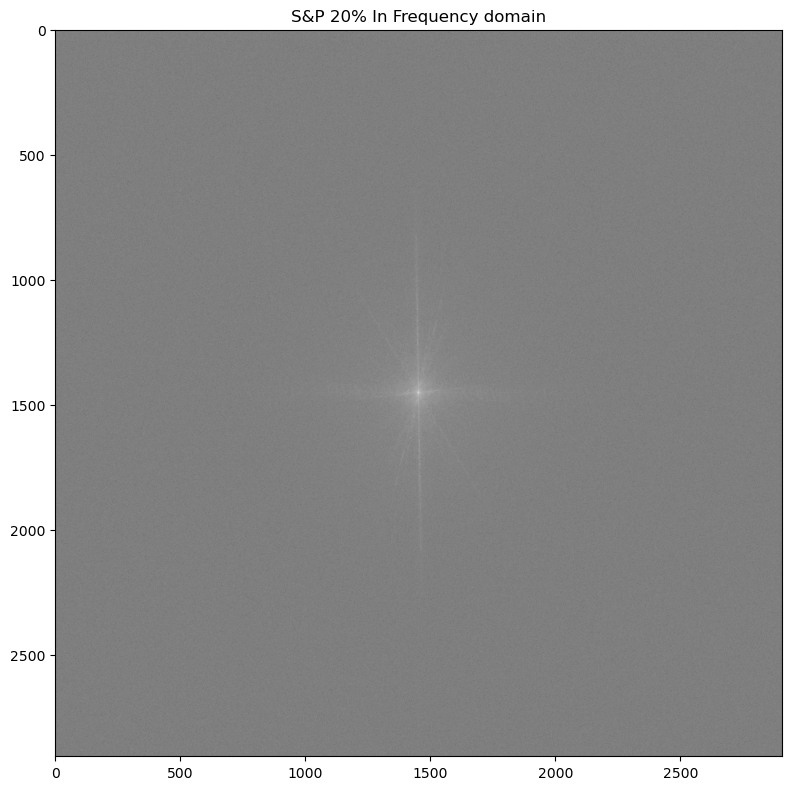

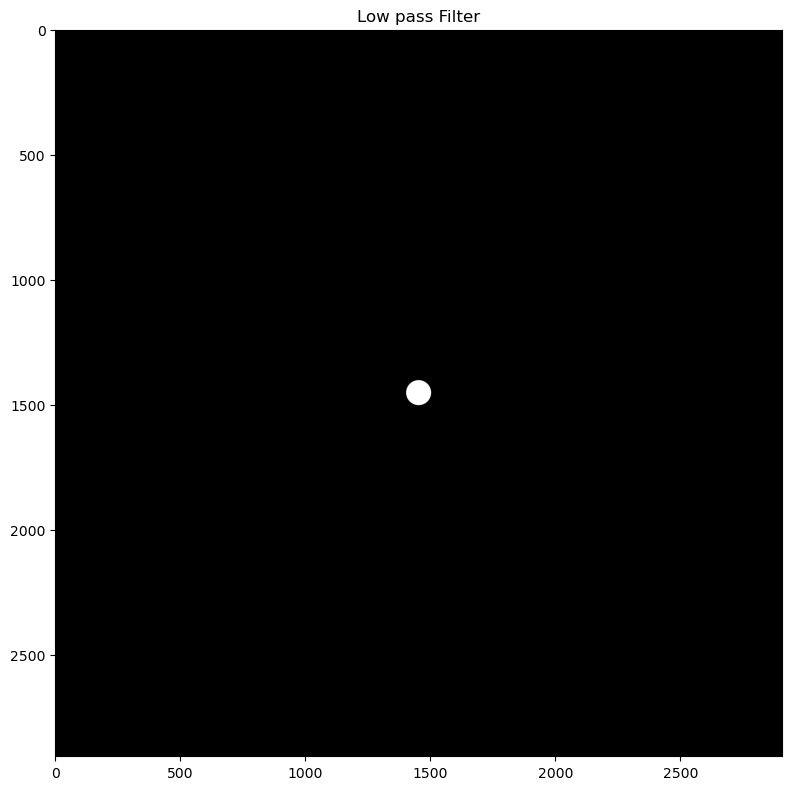

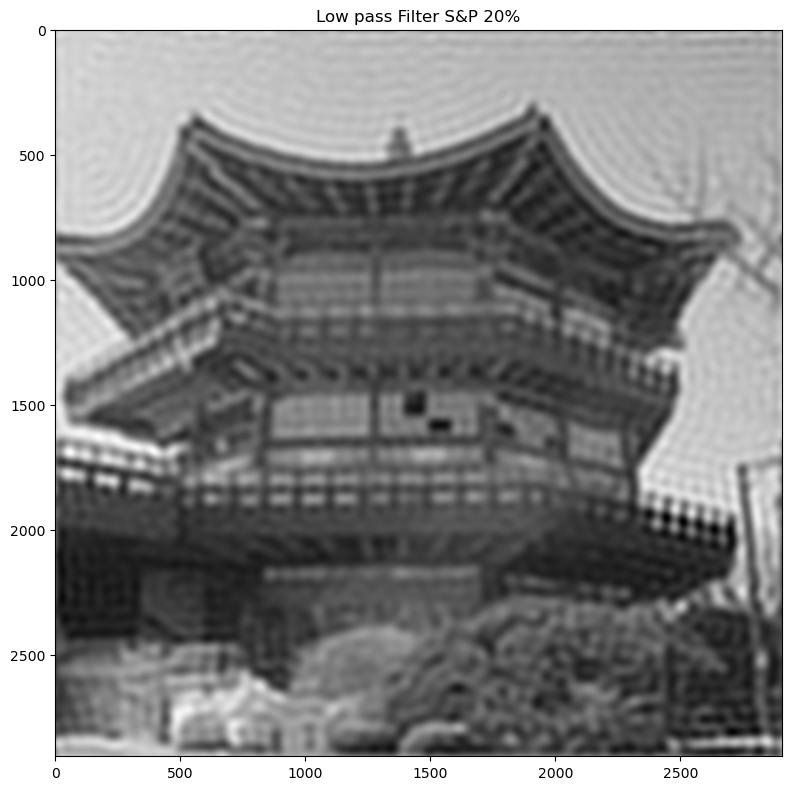

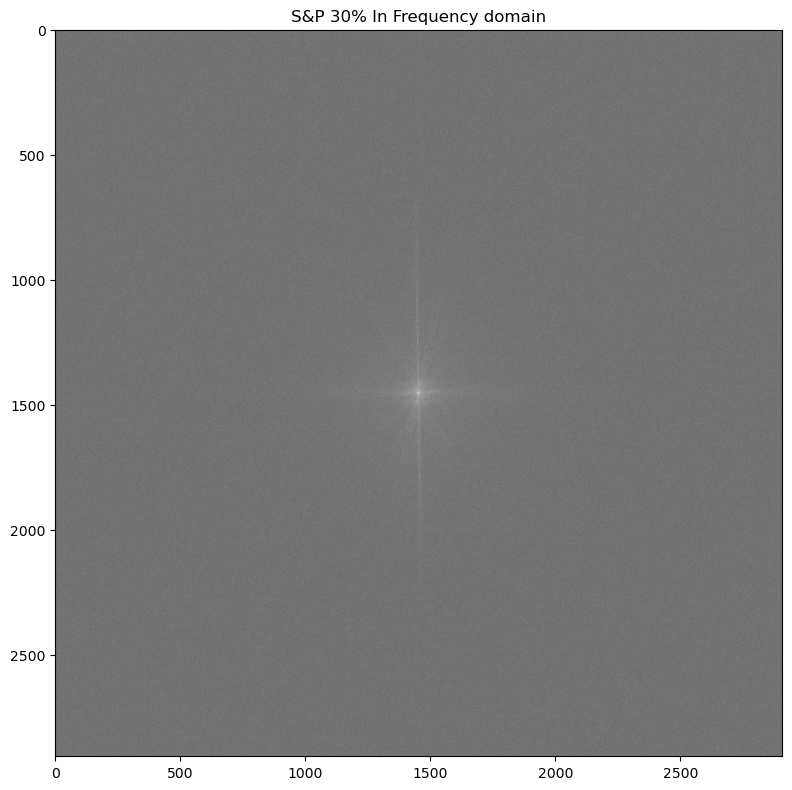

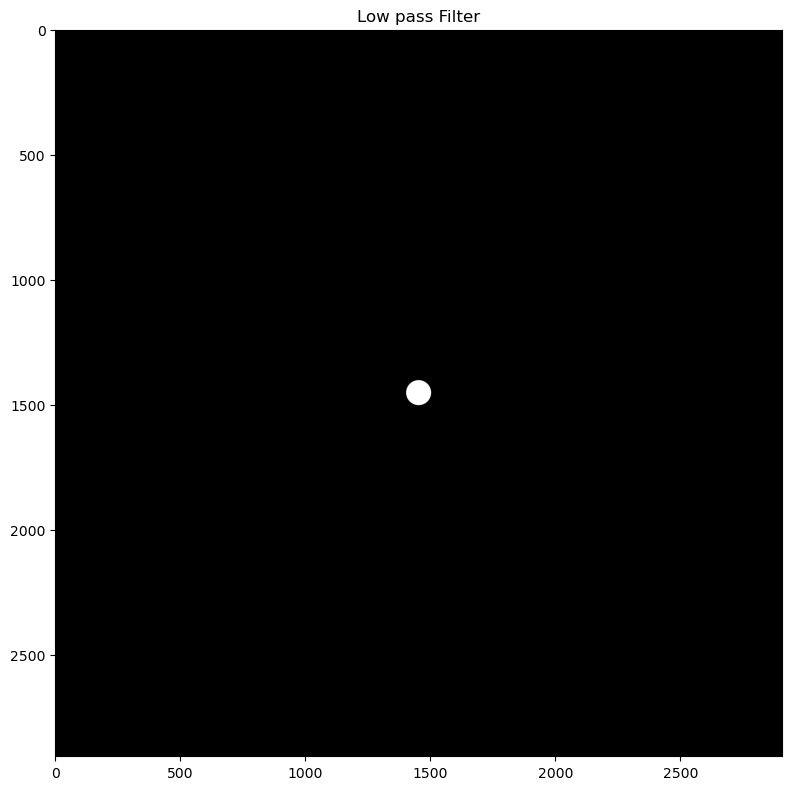

...

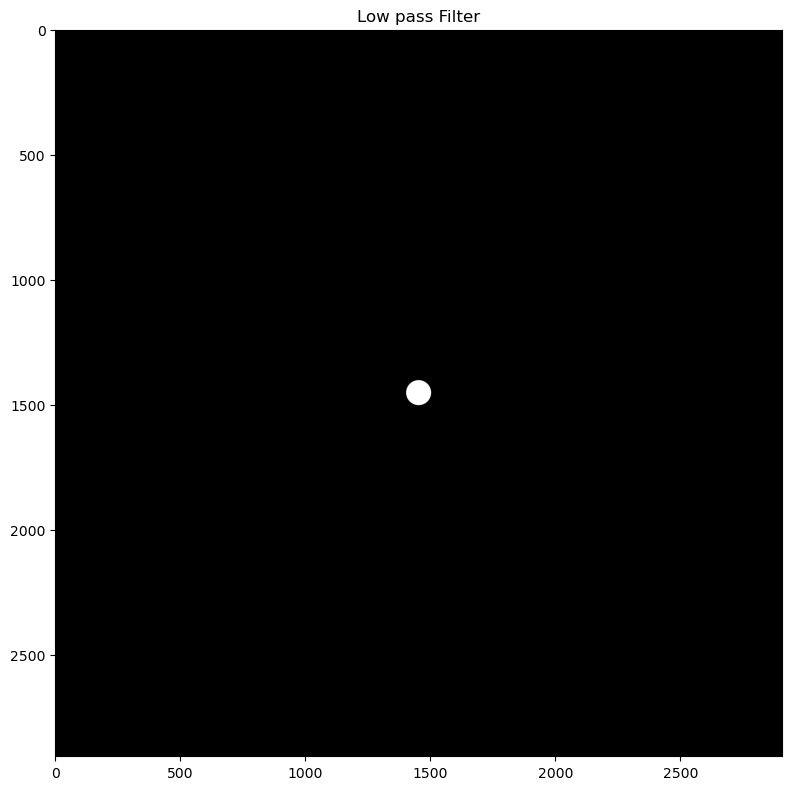

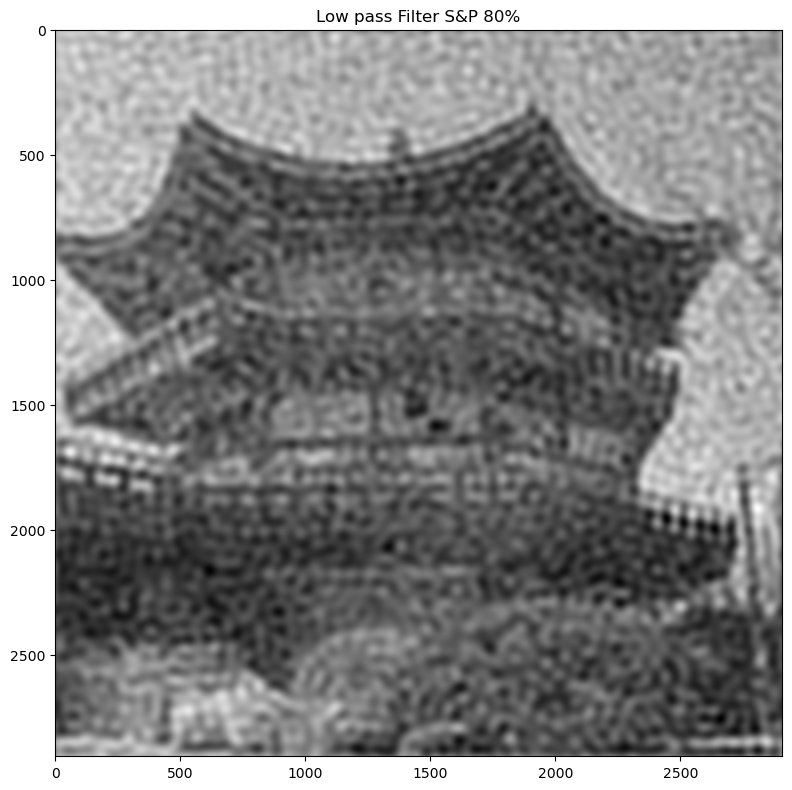

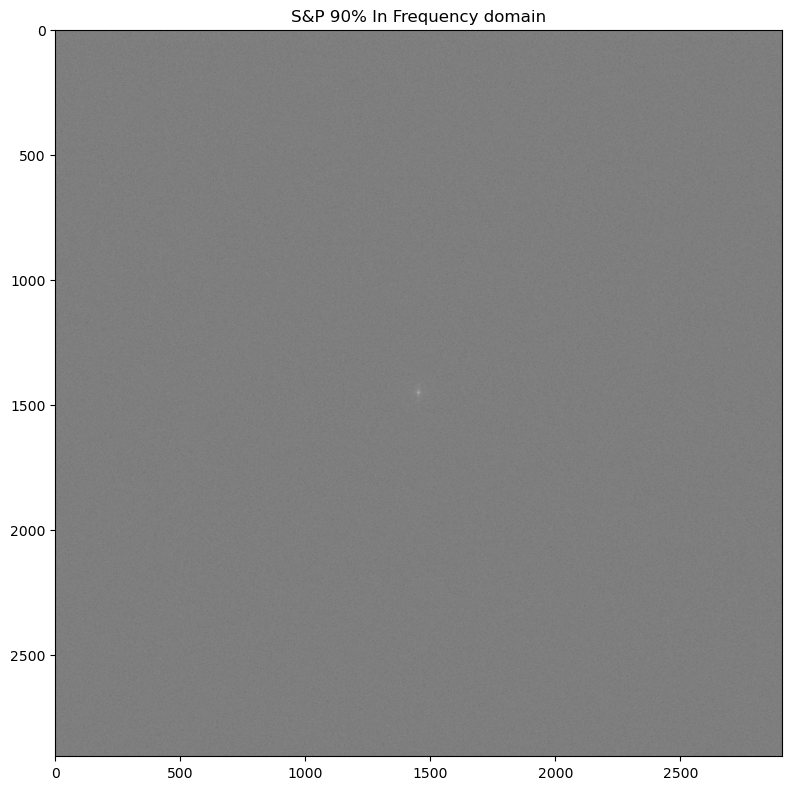

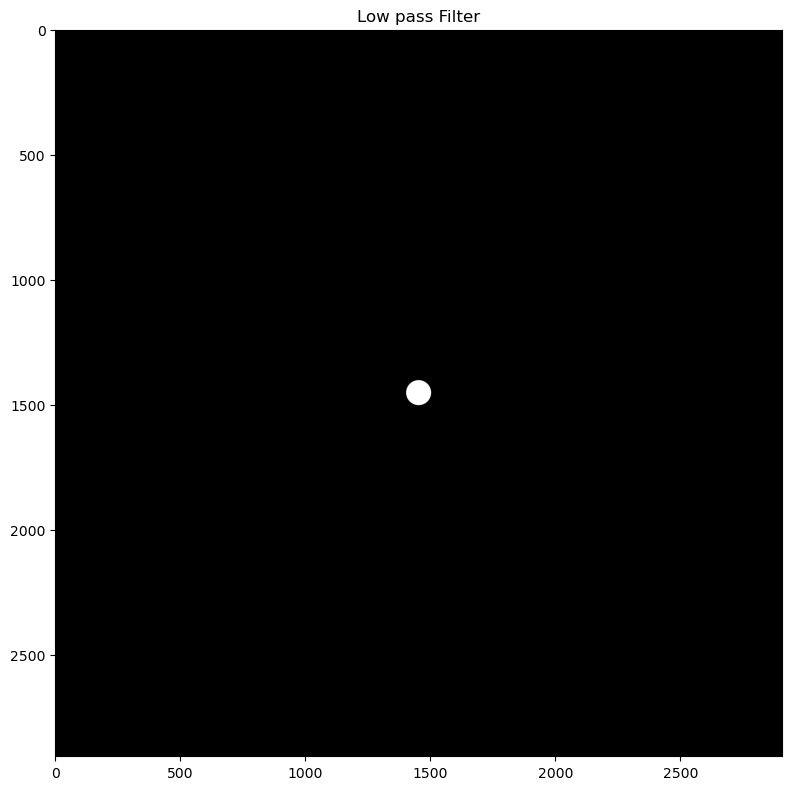

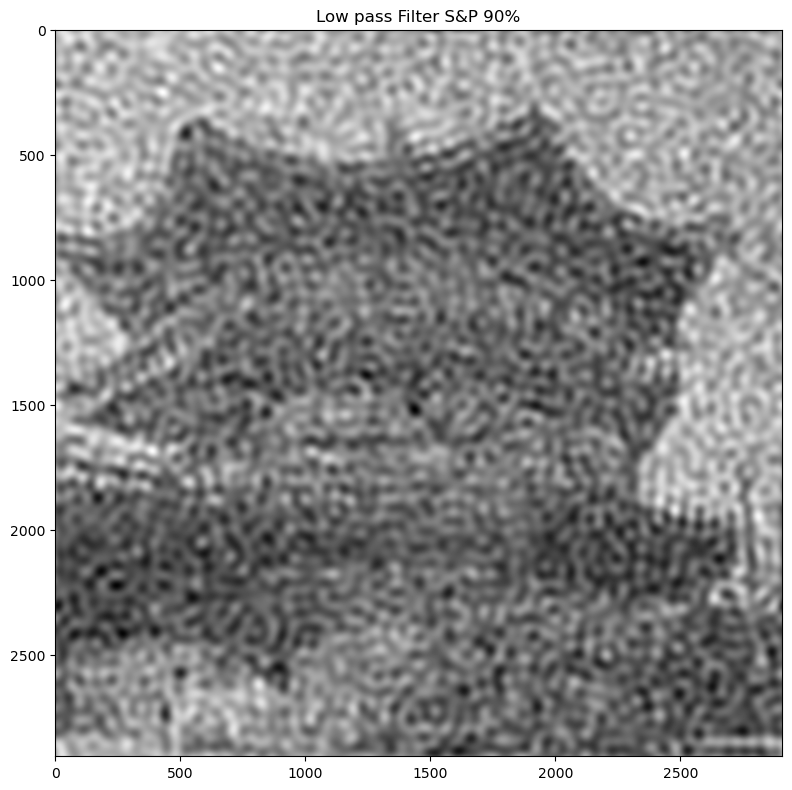

In [36]:
# s&p image Low pass 영상 형성 및 저장
sp=['sp02.jpg','sp03.jpg','sp04.jpg','sp05.jpg','sp06.jpg','sp07.jpg','sp08.jpg','sp09.jpg']
for i,img in zip(range(2,10),sp):
    low_pass(img,i)

In [34]:
#Low pass no axis
for i,img in zip(range(2,10),sp):
    f=cv2.imread(img)
    f=cv2.cvtColor(f, cv2.COLOR_BGR2GRAY)
    F = np.fft.fft2(f)
    Fshift = np.fft.fftshift(F)
    M,N=f.shape
    H=np.zeros((M,N),dtype=np.float32)
    D0=50
    for u in range(M):
        for v in range(N):
            D=np.sqrt((u-M/2)**2+(v-N/2)**2)
            if D <= D0:
                H[u,v]=1
            else:
                H[u,v]=0
    Gshift=Fshift*H
    G=np.fft.ifftshift(Gshift)
    g=np.abs(np.fft.ifft2(G))
    cv2.imwrite('LPSP_nonax{}0.jpg'.format(i), g)

In [98]:
#Band-pass filter
import cv2
import numpy as np
def bandpass (img,i):
    img=cv2.imread(img)
    img=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    f=np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    rows, cols = img.shape
    crow, ccol = rows//2, cols//2
    mask = np.zeros((rows, cols), np.uint8)
    mask[crow-10:crow+10, ccol-10:ccol+10] = 1
    fshift_filtered = fshift * mask
    f_ishift = np.fft.ifftshift(fshift_filtered)
    img_filtered = np.fft.ifft2(f_ishift)
    img_filtered = np.abs(img_filtered)
    fig,ax=plt.subplots(figsize=(8,8))
    ax.imshow(img_filtered,cmap='gray')
    plt.tight_layout()
    ax.set_title('Band pass Filter S&P {}0%'.format(i))
    fig.savefig('BPF{}0.jpg'.format(i))

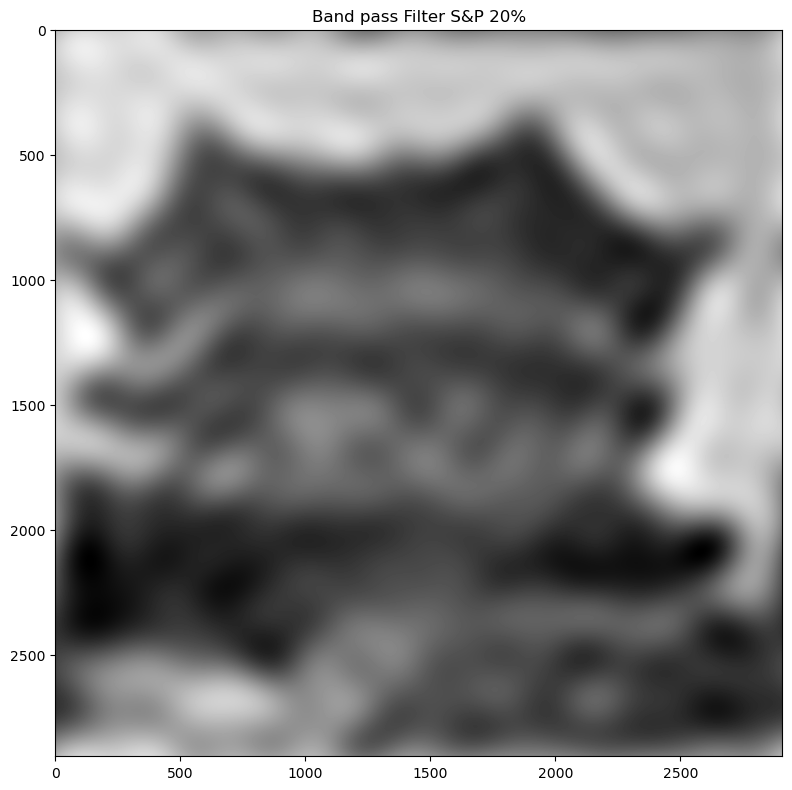

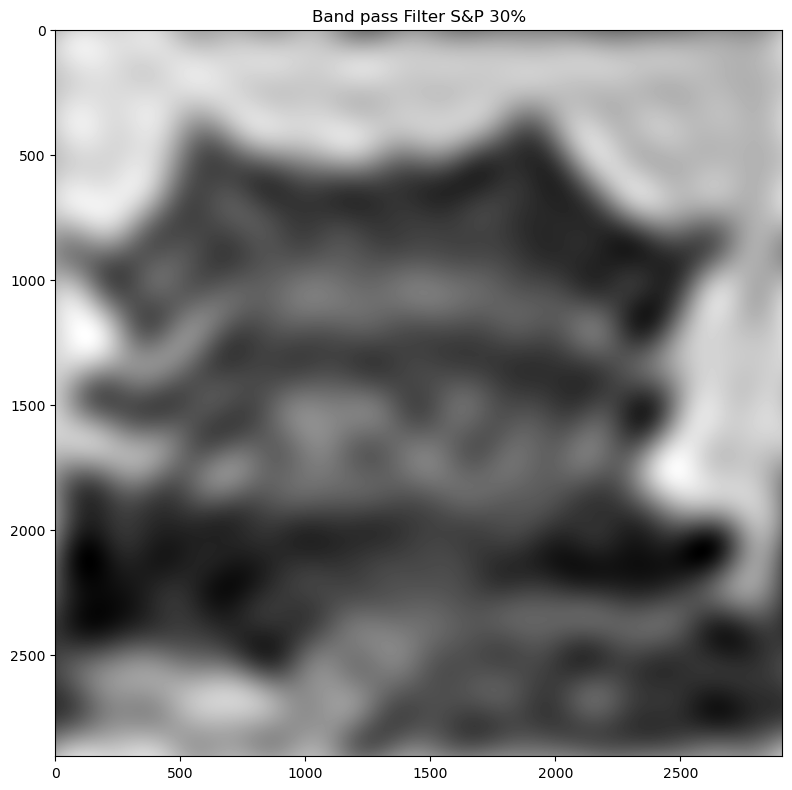

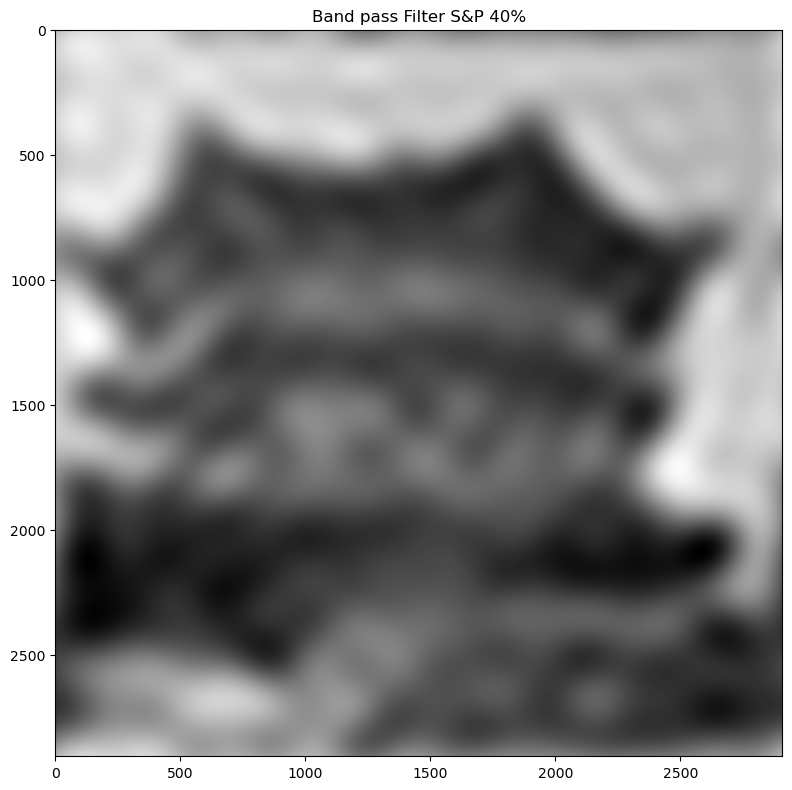

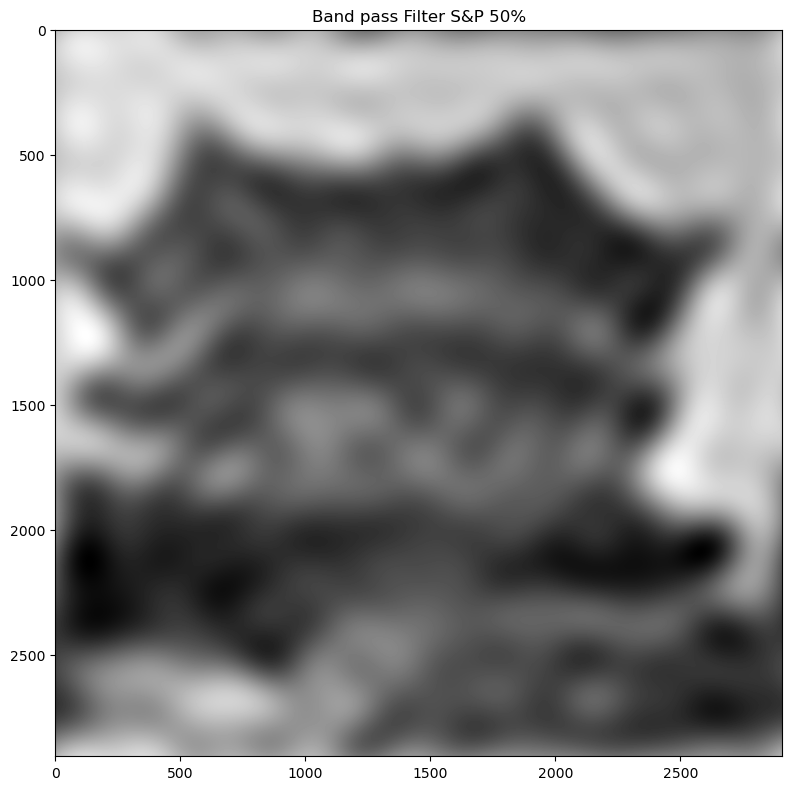

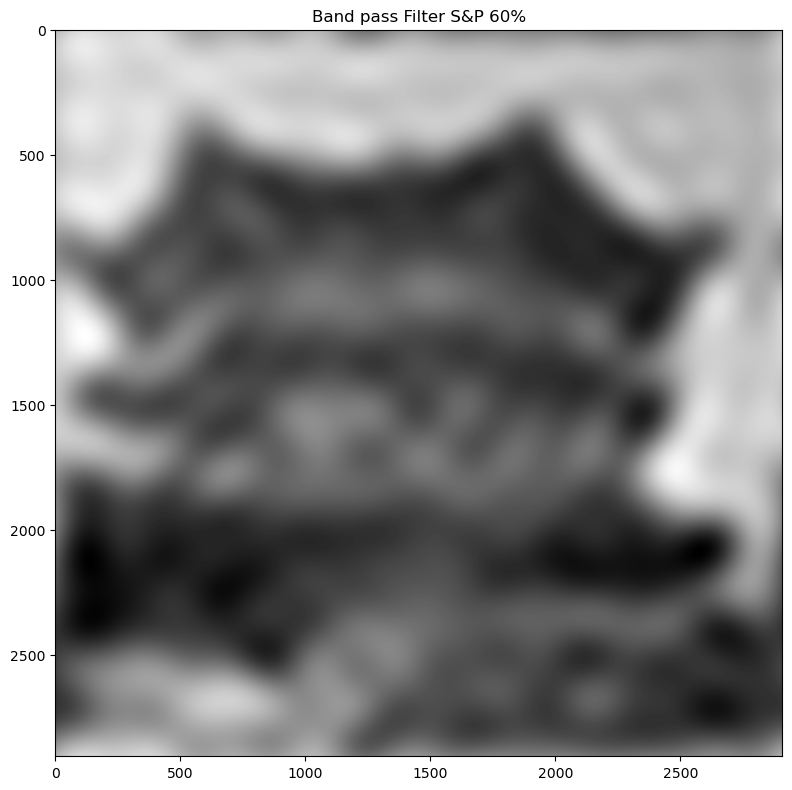

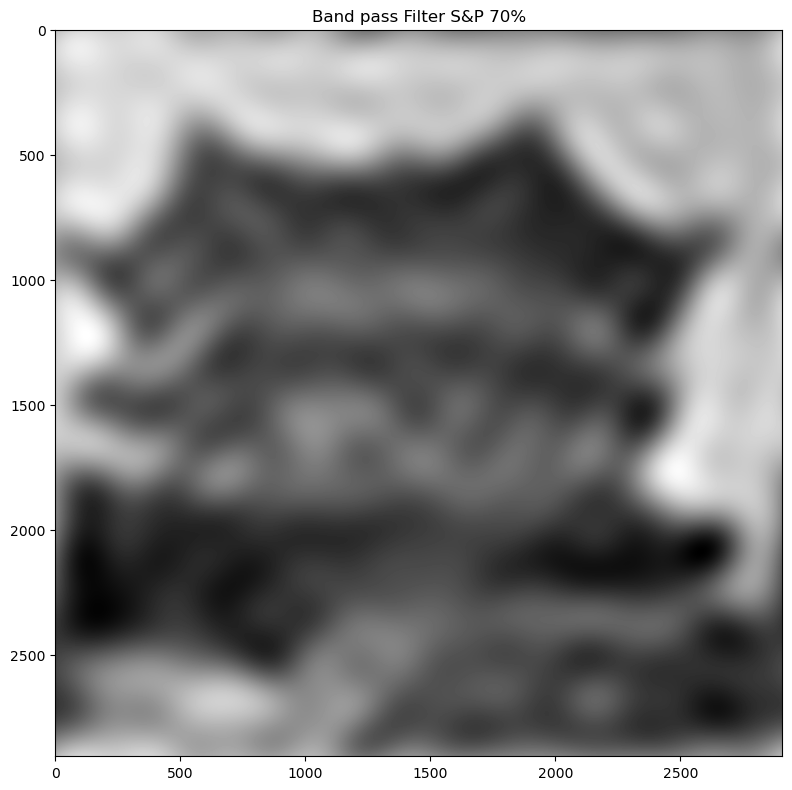

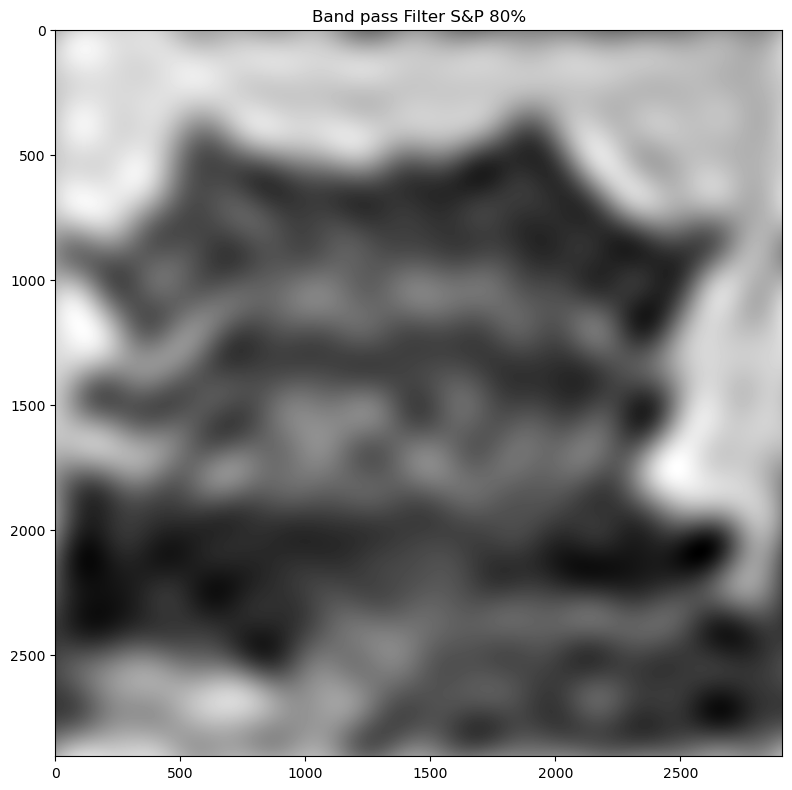

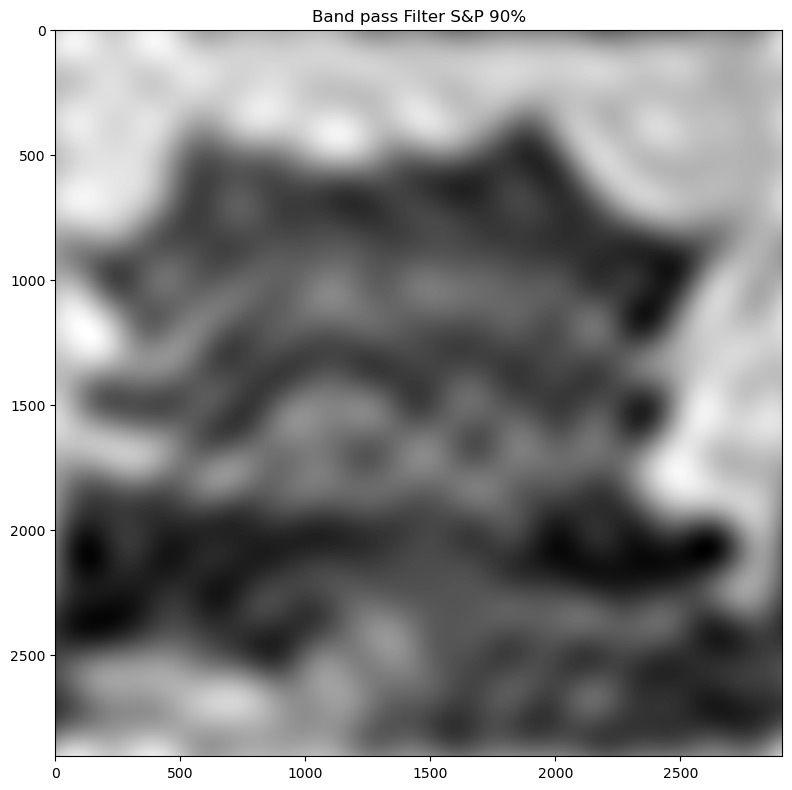

In [99]:
#band pass 영상 제작 및 저장
sp=['sp02.jpg','sp03.jpg','sp04.jpg','sp05.jpg','sp06.jpg','sp07.jpg','sp08.jpg','sp09.jpg']
for i,img in zip(range(2,10),sp):
    bandpass(img,i)

In [113]:
#PSNR low pass
import cv2
import numpy as np

def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))
lp=[]
for i in range(2,10):
    img1 = cv2.imread('sp0{}.jpg'.format(i))
    img2 = cv2.imread('LPSP_nonax{}0.jpg'.format(i))
    lp.append(psnr(img1, img2))
print(lp)

TypeError: unsupported operand type(s) for -: 'int' and 'NoneType'

In [90]:
#PSNR band pass
import cv2
import numpy as np

def psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))
bp=[]
for i in range(2,10):
    img1 = cv2.imread('sp0{}.jpg'.format(i))
    img2 = cv2.imread('BPF_nonax{}0.jpg'.format(i))
    bp.append(psnr(img1, img2))
print(bp)

[27.90673286196379, 27.684962022278405, 27.62851529608456, 27.65854987115871, 27.754018269910187, 27.86427340695206, 28.245603509434986, 30.820775232683346]


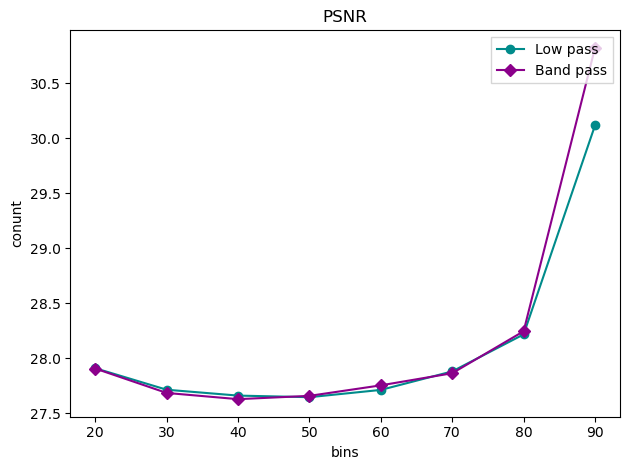

In [95]:
#PSNR low pass-band pass 그래프
X=[20,30,40,50,60,70,80,90]
Y_1=lp
Y_2=bp

plt.plot(X,Y_1,linestyle='-',marker='o',c='darkcyan',label='Low pass') #파란색 그래프
plt.plot(X,Y_2,linestyle='-',marker='D',c='darkmagenta',label='Band pass') #주황색 그래프
plt.legend(shadow=False, fancybox=False, loc='upper right')
plt.title('PSNR'),plt.xlabel('bins'),plt.ylabel('conunt')
plt.tight_layout()
plt.savefig('PSNR_LPBP.jpg')
plt.show()

In [140]:
#High-pass filter
import cv2
import numpy as np
import matplotlib.pyplot as plt

def high_pass(img):
    f = cv2.imread(img)
    f = cv2.cvtColor(f, cv2.COLOR_BGR2GRAY)
    Gauss = cv2.GaussianBlur(f, (9, 9), 0)
    
    fig, ax = plt.subplots(figsize=(8,8))
    ax.imshow(Gauss, cmap='gray')
    plt.tight_layout()
    ax.set_title('Gaussian Blur')
    fig.savefig('Gauss.jpg')
    
    F = np.fft.fft2(Gauss)
    Fshift = np.fft.fftshift(F)
    
    fig, ax = plt.subplots(figsize=(8,8))
    ax.imshow(np.log1p(np.abs(Fshift)), cmap='gray')
    plt.tight_layout()
    ax.set_title('Gaussian Blur In Frequency domain')
    fig.savefig('Gauss In Frequency domain.jpg')
    
    M, N = f.shape
    H = np.zeros((M, N), dtype=np.float32)
    D0 = 50
    
    for u in range(M):
        for v in range(N):
            D = np.sqrt((u-M/2)**2 + (v-N/2)**2)
            if D <= D0:
                H[u,v] = 0
            else:
                H[u,v] = 1
    
    fig, ax = plt.subplots(figsize=(8,8))
    ax.imshow(H, cmap='gray')
    plt.tight_layout()
    ax.set_title('High pass Filter')
    fig.savefig('HighPassfilter.jpg')
    
    Gshift = Fshift * H
    G = np.fft.ifftshift(Gshift)
    g = np.abs(np.fft.ifft2(G))
    
    fig, ax = plt.subplots(figsize=(8,8))
    ax.imshow(g, cmap='gray')
    plt.tight_layout()
    ax.set_title('High pass Filter')
    fig.savefig('HighPassfiltering.jpg')
    cv2.imwrite('Highpass.jpg', g)

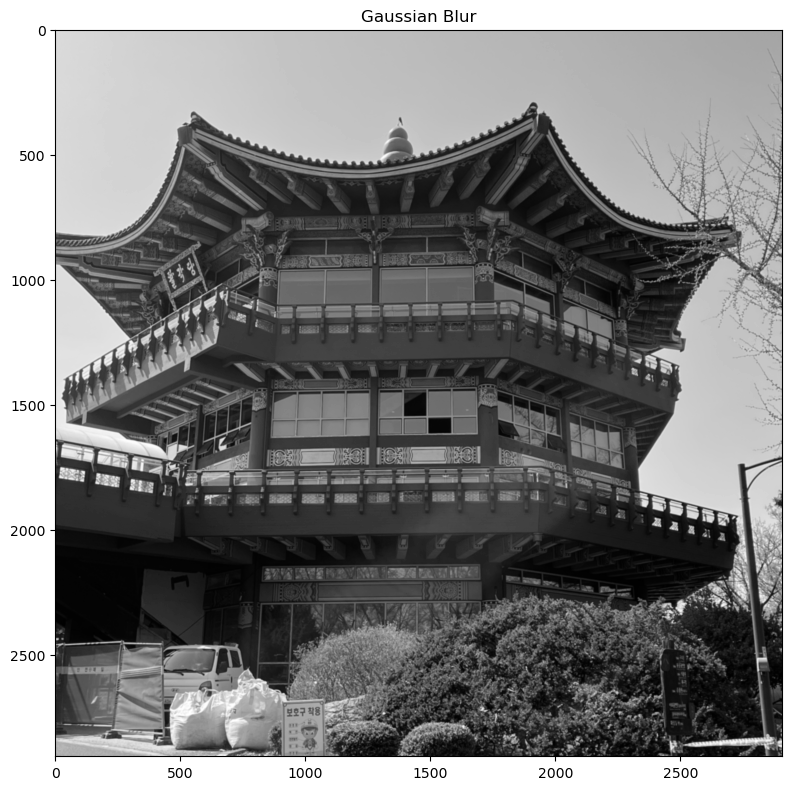

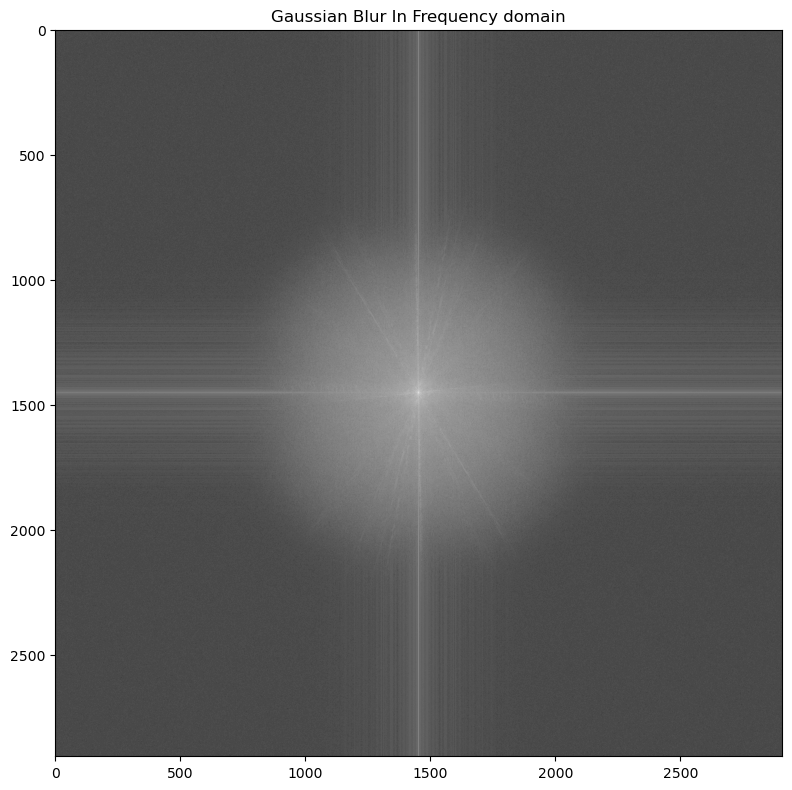

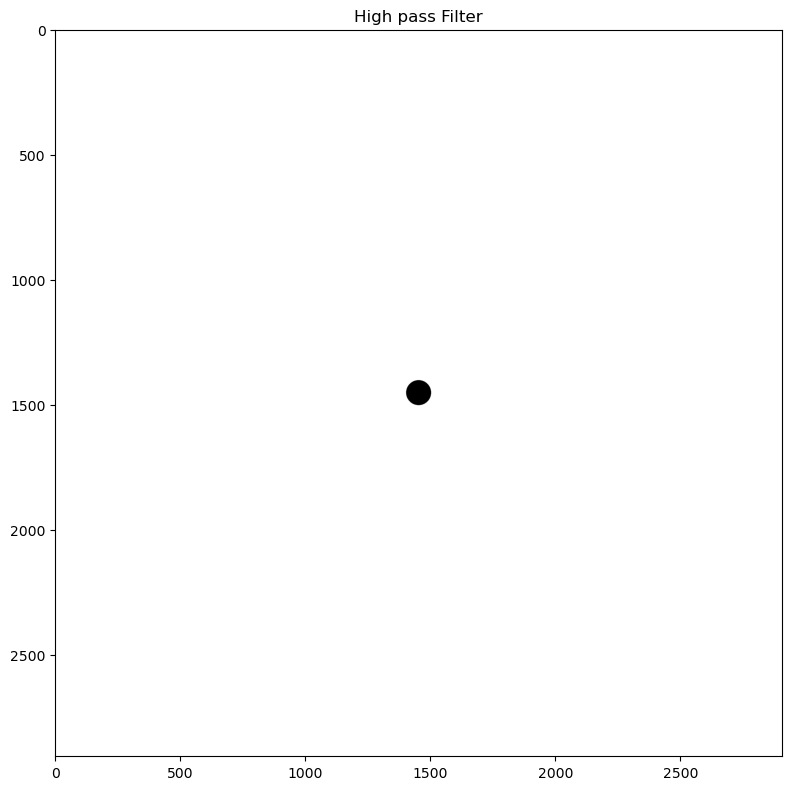

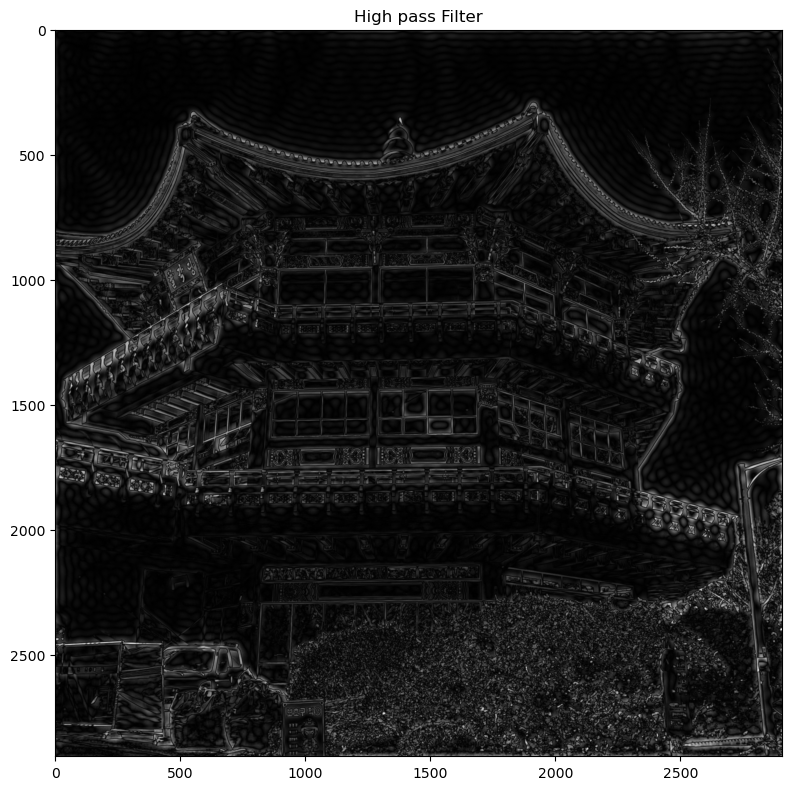

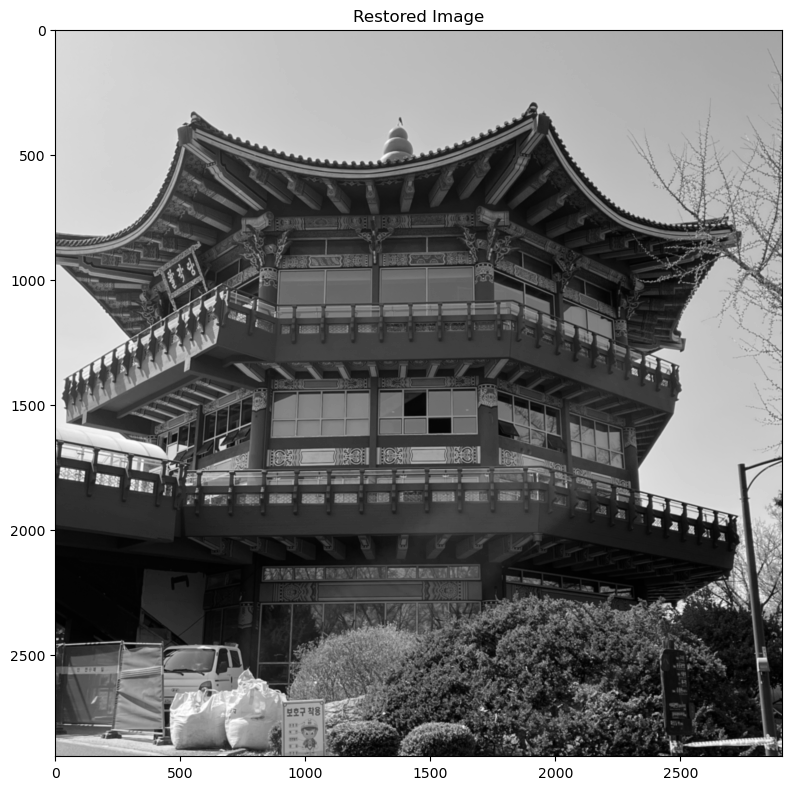

In [141]:
# s&p image high pass 영상 형성 및 저장
high_pass('Kids_park.jpeg')

In [159]:
# Assuming `img` is the original image and `sharpened_img` is the image after the sharpening process
img=cv2.imread('Gauss_.jpg')
img = img.astype(np.int32)  # Convert to a signed integer type to avoid overflow issues
sharpened_img=cv2.imread('HighPass.jpg')
sharpened_img = sharpened_img.astype(np.int32)

# Calculate the difference image (edges)
difference_img = img - sharpened_img

# Add the difference image back to the original image
restored_img = img + difference_img

# Clip values to the range [0, 255] and convert the data type back to uint8
restored_img = np.clip(restored_img, 0, 255).astype(np.uint8)
cv2.imwrite('Restored_HP.jpg',restored_img)

True

In [160]:
import cv2
import numpy as np
f = cv2.imread('Kids_park.jpeg')
f = cv2.cvtColor(f, cv2.COLOR_BGR2GRAY)
Gauss = cv2.GaussianBlur(f, (9, 9), 0)
cv2.imwrite('Gauss_.jpg',Gauss)
cv2.imwrite('Gray.jpg',f)
img1 = cv2.imread('Gray.jpg')
img2 = cv2.imread('Restored_HP.jpg')
print(cv2.PSNR(img1,img2))

12.404204893421472


In [153]:
#Band-pass filter
import cv2
import numpy as np

def bandstop (img):
    a=cv2.imread(img)
    a=cv2.cvtColor(a, cv2.COLOR_BGR2GRAY)
    Gauss = cv2.GaussianBlur(a, (9, 9),0)
    f=np.fft.fft2(Gauss)
    fshift = np.fft.fftshift(f)
    rows, cols = Gauss.shape
    crow, ccol = rows//2, cols//2
    mask = np.ones((rows, cols), np.uint8)
    mask[crow-10:crow+10, ccol-10:ccol+10] = 0
    fig,ax=plt.subplots(figsize=(8,8))
    ax.imshow(mask,cmap='gray')
    plt.tight_layout()
    ax.set_title('Band stop Filter')
    fig.savefig('Bandstopfilter.jpg')
    fshift_filtered = fshift * mask
    f_ishift = np.fft.ifftshift(fshift_filtered)
    img_filtered = np.fft.ifft2(f_ishift)
    img_filtered = np.abs(img_filtered)
    fig,ax=plt.subplots(figsize=(8,8))
    ax.imshow(img_filtered,cmap='gray')
    plt.tight_layout()
    ax.set_title('Band stop Filter Filter')
    fig.savefig('Band stop.jpg')
    cv2.imwrite('BS.jpg',img_filtered)

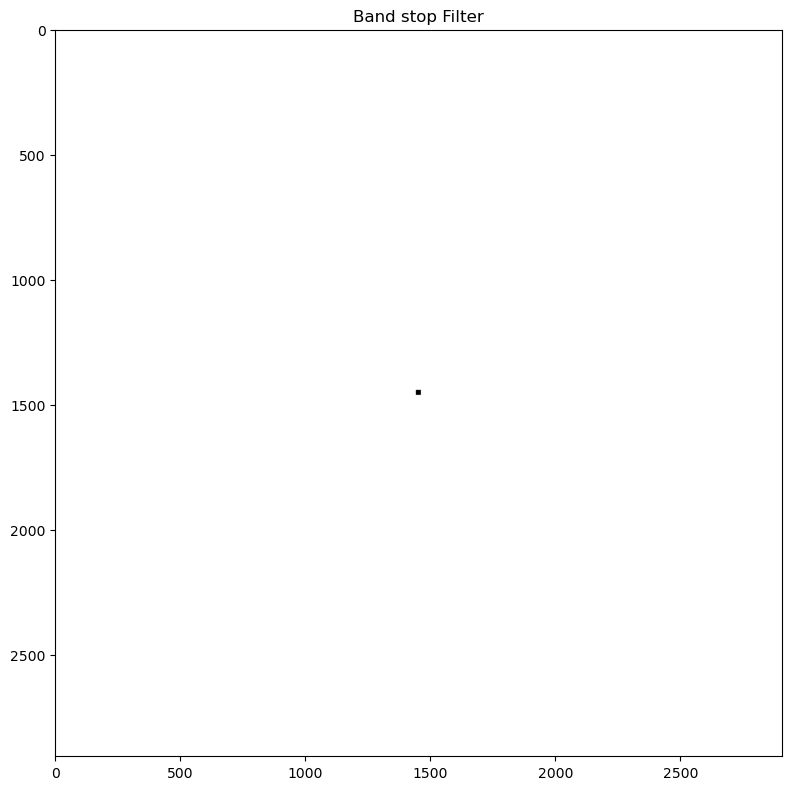

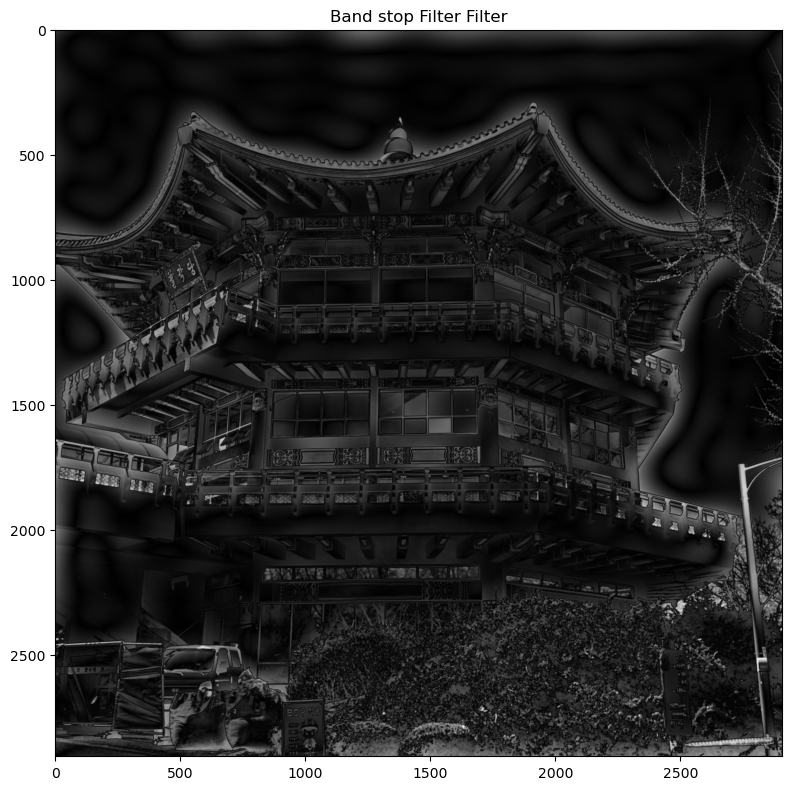

In [126]:
#band stop 이미지 형성 및 저장
bandstop('Kids_park.jpeg')

In [158]:
img=cv2.imread('Gauss_.jpg')
img = img.astype(np.int32)  # Convert to a signed integer type to avoid overflow issues
sharpened_img1=cv2.imread('BS.jpg')
sharpened_img1 = sharpened_img1.astype(np.int32)

# Calculate the difference image (edges)
difference_img1 = img - sharpened_img1

# Add the difference image back to the original image
restored_img1 = img + difference_img1

# Clip values to the range [0, 255] and convert the data type back to uint8
restored_img1 = np.clip(restored_img1, 0, 255).astype(np.uint8)
cv2.imwrite('Restored_BS.jpg',restored_img1)

True

In [161]:
import cv2
import numpy as np
f = cv2.imread('Kids_park.jpeg')
f = cv2.cvtColor(f, cv2.COLOR_BGR2GRAY)
Gauss = cv2.GaussianBlur(f, (9, 9), 0)
cv2.imwrite('Gauss_.jpg',Gauss)
cv2.imwrite('Gray.jpg',f)
img1 = cv2.imread('Gray.jpg')
img2 = cv2.imread('Restored_BS.jpg')
print(cv2.PSNR(img1,img2))

12.917305741502725


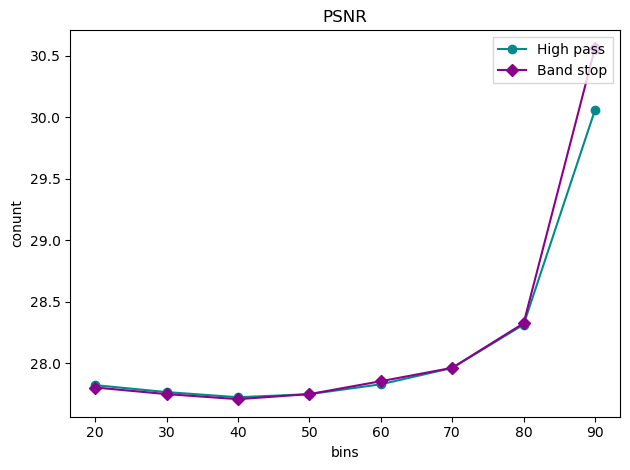

In [115]:
#PSNR low pass-band pass 그래프
X=[20,30,40,50,60,70,80,90]
Y_1=hp
Y_2=bs

plt.plot(X,Y_1,linestyle='-',marker='o',c='darkcyan',label='High pass') #파란색 그래프
plt.plot(X,Y_2,linestyle='-',marker='D',c='darkmagenta',label='Band stop') #주황색 그래프
plt.legend(shadow=False, fancybox=False, loc='upper right')
plt.title('PSNR'),plt.xlabel('bins'),plt.ylabel('conunt')
plt.tight_layout()
plt.savefig('PSNR_HPBS.jpg')
plt.show()